NAME: KAINAT RIAZ\
CMS ID: 327119\
CS876-COMPUTER VISION\
ASSIGNMENT # 3 (IMAGE STITCHING)

**it's necessary to install this version of opencv to run this code because the default version that google colab uses has disabled the SURF feature.**

In [ ]:
pip install opencv-contrib-python==3.4.2.17


     |████████████████████████████████| 30.6MB 125kB/s 
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


**importing libraries**

In [ ]:
import os
from PIL import Image
from google.colab import drive, files
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow


**importing test images from google drive and saving in a form of list**

In [ ]:

list=[]
images=[]
a=0
for i in range(1,6):
  list.append("image"+str(i)+'.jpeg')
for i in range(1,6):
  images.append("image"+str(i))

drive.mount('/content/drive/')
path = "/content/drive/My Drive/cv assign3/"
names=os.listdir(path)
for i in names:
        with Image.open(os.path.join(path,i),'r') as f:

            f.save(list[a])
            a=a+1



Mounted at /content/drive/


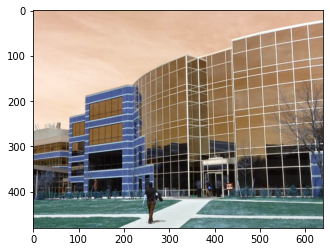

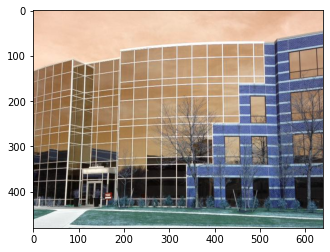

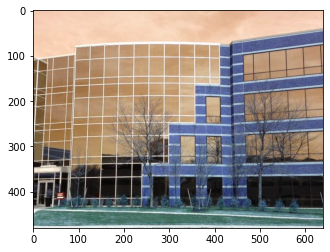

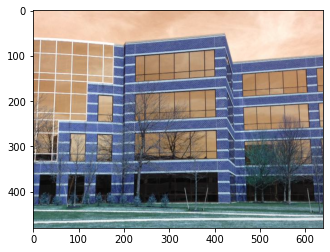

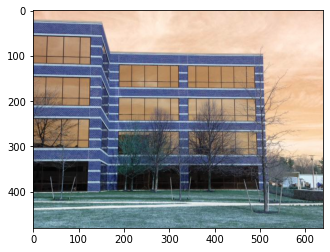

In [ ]:
for i in range(0,5):
  images[i]=cv2.imread(list[i])
  plt.imshow(images[i])
  plt.show()

**DETECTING KEYPOINT AND DESCRIPTORS**

In [ ]:
surf = cv2.xfeatures2d.SURF_create()
def getSURFFeatures(im):
	gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
	kp, des = surf.detectAndCompute(gray, None)
	return kp,des
kp1,des1=getSURFFeatures(images[0])
kp2,des2=getSURFFeatures(images[1])
kp3,des3=getSURFFeatures(images[2])
kp4,des4=getSURFFeatures(images[3])
kp5,des5=getSURFFeatures(images[4])

**FEATURE** **MATCHING**

In [ ]:
def matching(kp1,kp2,des1,des2,image1,image2):
  FLANN_INDEX_KDTREE = 1
  index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params,search_params)
  matches = flann.knnMatch(des1,des2,k=2)
  pts1 = []
  pts2 = []

  for i,(m,n) in enumerate(matches):
      if m.distance < 0.8*n.distance:
          pts2.append(kp2[m.trainIdx].pt)
          pts1.append(kp1[m.queryIdx].pt)
  pts1 = np.int32(pts1)
  pts2 = np.int32(pts2)

  H, s = cv2.findHomography(pts1, pts2, cv2.RANSAC, 4)
  print(H)
  print(pts1,pts2)

  img3 = cv2.drawMatchesKnn(image1,kp1,image2,kp2,matches[:50],None)

  plt.imshow(img3)
  plt.show()
  return H

**WARPING AND STITCHING**

In [ ]:
def warpImages(img1, img2, H):

  rows1, cols1 = img1.shape[:2]
  rows2, cols2 = img2.shape[:2]

  list_of_points_1 = np.float32([[0,0], [0, rows1],[cols1, rows1], [cols1, 0]]).reshape(-1, 1, 2)
  temp_points = np.float32([[0,0], [0,rows2], [cols2,rows2], [cols2,0]]).reshape(-1,1,2)

  # When we have established a homography we need to warp perspective
  # Change field of view
  list_of_points_2 = cv2.perspectiveTransform(temp_points, H)

  list_of_points = np.concatenate((list_of_points_1,list_of_points_2), axis=0)

  [x_min, y_min] = np.int32(list_of_points.min(axis=0).ravel() - 0.5)
  [x_max, y_max] = np.int32(list_of_points.max(axis=0).ravel() + 0.5)

  translation_dist = [-x_min,-y_min]

  H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])

  output_img = cv2.warpPerspective(img2, H_translation.dot(H), (x_max-x_min, y_max-y_min))
  output_img[translation_dist[1]:rows1+translation_dist[1], translation_dist[0]:cols1+translation_dist[0]] = img1

  return output_img

**STITCHING 1ST AND 2ND IMAGES TOGETHER & 3RD AND 4TH IMAGES TOGETHER**

[[ 1.24561431e+00 -9.78065597e-02 -3.09493175e+02]
 [ 1.86964452e-01  1.15592680e+00 -5.39974329e+01]
 [ 4.28324371e-04 -6.12397906e-05  1.00000000e+00]]
[[380 324]
 [433 389]
 [437 343]
 ...
 [500 197]
 [537  35]
 [379  95]] [[116 342]
 [165 410]
 [174 364]
 ...
 [242 397]
 [617 398]
 [144 107]]


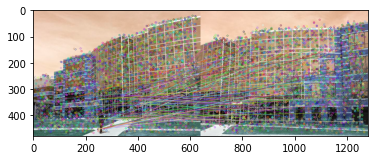

[[ 1.16329036e+00 -5.01591727e-02 -2.73047560e+02]
 [ 9.69588310e-02  1.09289543e+00 -3.53800939e+01]
 [ 3.48261046e-04 -5.81146554e-05  1.00000000e+00]]
[[293 329]
 [293 286]
 [154 344]
 ...
 [ 91 314]
 [614  50]
 [592  64]] [[ 47 324]
 [ 49 280]
 [115 136]
 ...
 [ 60 285]
 [288  69]
 [376  72]]


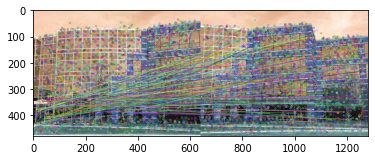

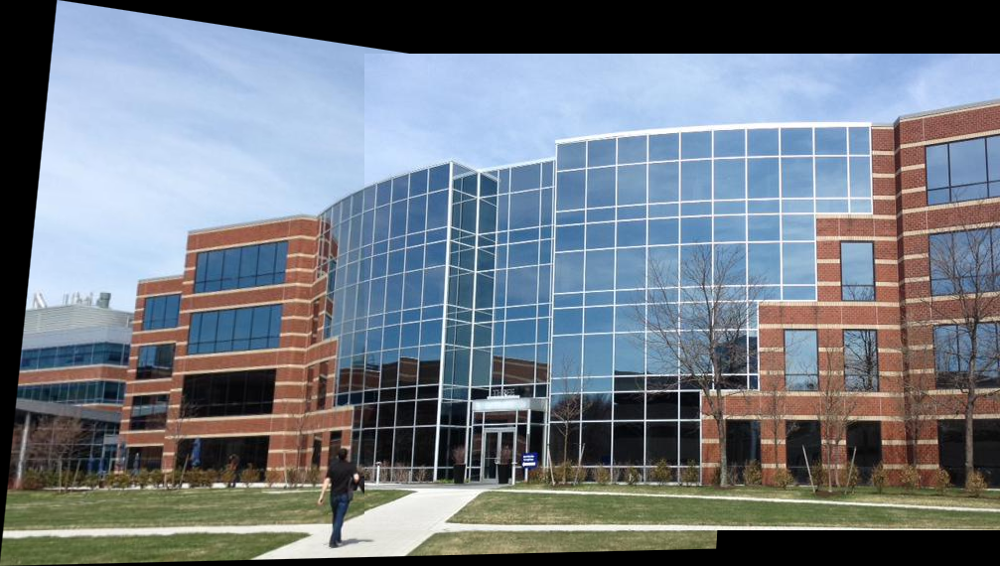

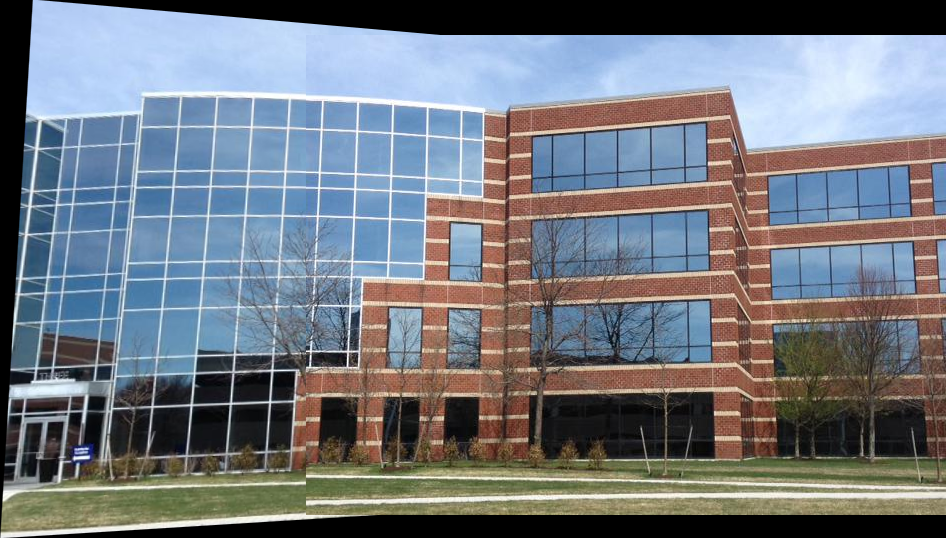

In [ ]:
H01=matching(kp1,kp2,des1,des2,images[0],images[1])
H23=matching(kp3,kp4,des3,des4,images[2],images[3])
result1 = warpImages(images[1], images[0], H01)
cv2_imshow(result1)
result2 = warpImages(images[3], images[2], H23)
cv2_imshow(result2)


**STITCHING RESULT1 AND RESULT2 TOGETHER**




[[ 1.83657898e+00 -1.16990996e-01 -8.12729390e+02]
 [ 2.39223416e-01  1.52148397e+00 -2.20844459e+02]
 [ 7.10708860e-04 -6.37810090e-05  1.00000000e+00]]
[[532 464]
 [526 415]
 [510 439]
 ...
 [605 111]
 [949 522]
 [ 48  73]] [[ 81 453]
 [ 77 400]
 [ 54 428]
 ...
 [197  68]
 [342 507]
 [413  31]]


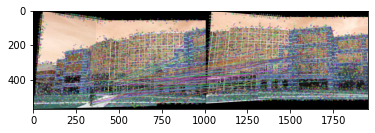

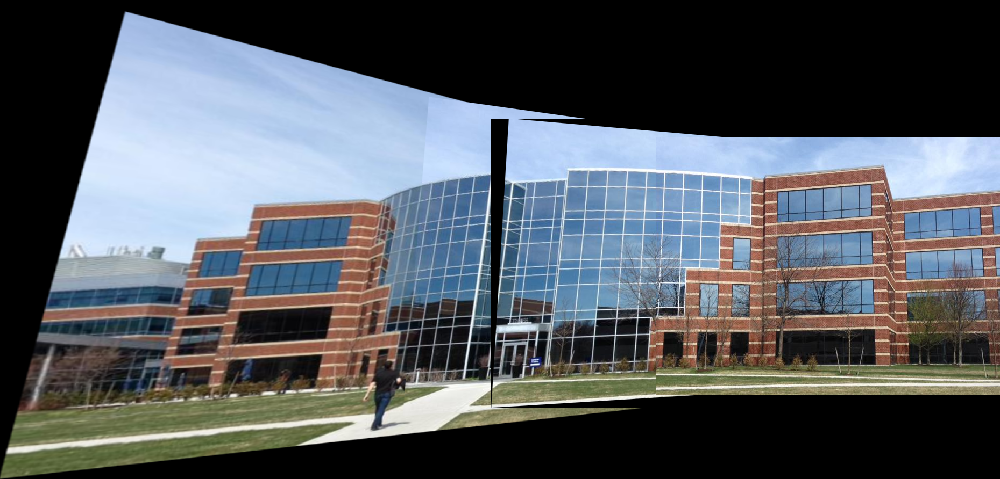

In [ ]:
kp6,des6=getSURFFeatures(result1)
kp7,des7=getSURFFeatures(result2)
H0123=matching(kp6,kp7,des6,des7,result1,result2)
result3 = warpImages(result2,result1, H0123)
cv2_imshow(result3)

**STITCHING RESULT3 AND 5TH IMAGE TOGETHER**

[[ 3.85007117e+00 -1.70851163e-01 -5.72325053e+03]
 [ 5.25062142e-01  3.56660409e+00 -1.86567482e+03]
 [ 1.52454118e-03  7.76906047e-05  1.00000000e+00]]
[[ 916  224]
 [ 941  223]
 [ 660  792]
 ...
 [1558  420]
 [1742  411]
 [1738  369]] [[494 110]
 [494 110]
 [240 243]
 ...
 [ 27 428]
 [219 134]
 [360 101]]


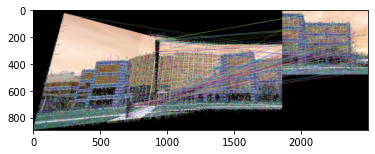

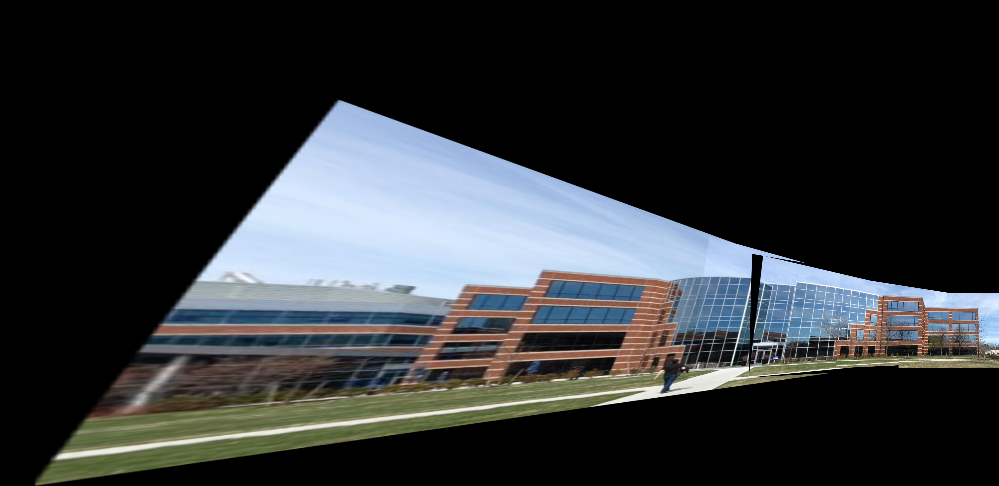

In [ ]:
kp9,des9=getSURFFeatures(result3)
kp8,des8=getSURFFeatures(images[4])
HR34=matching(kp9,kp8,des9,des8,result3,images[4])
resultfinal = warpImages(images[4],result3, HR34)
cv2_imshow(resultfinal)
